## Forced Oscillator - DifferentialEquations.jl approach

### Packages

In [1]:
import Pkg
Pkg.add("Symbolics")
Pkg.add("Plots")
Pkg.add("LaTeXStrings")
Pkg.add("DifferentialEquations")
Pkg.add("ModelingToolkit")
Pkg.add("Measures")
Pkg.add("PlotThemes")
Pkg.add("CurveFit")
Pkg.add("EasyModelAnalysis")
Pkg.add("ChaosTools")

using Symbolics, Plots, DifferentialEquations, ModelingToolkit, LaTeXStrings, Measures, EasyModelAnalysis, CurveFit, ChaosTools

   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\shiha\.julia\environments\v1.9\Project.toml`
  No Changes to 

### System definition

In [25]:
@variables t x(t) y(t) #x for entire problem, y for the linear problem
@parameters F, ω
d = Differential(t)

(::Differential) (generic function with 3 methods)

In [26]:
E₁ = d(d(x)) + ω^2*sin(x) #Full system
E₂ = d(d(y)) + y*ω^2 #Linearised system

E₁₁ = Symbolics.solve_for(E₁ ~ ω^2*F*cos(ω*t), d(d(x)))
E₂₂ = Symbolics.solve_for(E₂ ~ ω^2*F*cos(ω*t), d(d(y)))

F*(ω^2)*cos(t*ω) - (ω^2)*y(t)

In [27]:
#Define model for full system
system = [d(d(x)) ~ E₁₁]

@named model = ODESystem(system, t, [x], [F, ω])
model = structural_simplify(model)

#Define model for linearised system
system2 = [d(d(y)) ~ E₂₂]

@named model2 = ODESystem(system2, t, [y], [F, ω])
model2 = structural_simplify(model2)

Model model2 with 2 equations
States (2):
  yˍt(t)
  y(t)
Parameters (2):
  F
  ω
Incidence matrix:2×4 SparseArrays.SparseMatrixCSC{Num, Int64} with 4 stored entries:
 ⋅  ×  ×  ⋅
 ×  ⋅  ⋅  ×

### Differential equation setup and solution

In [28]:
u_1 = [d(x) => 1e-4
          x => 0] # initial displacement is 0 and initial velocity negligible for external factors

u_2 = [d(y) => 1e-4
          y => 0] # initial displacement is 0 and initial velocity negligible for external factors

q = [ω => 1
     F => 0.1] # ω = 1 takes care of the dimensionless case

tspan = (0.0, 200) #total time of evolution 

(0.0, 200)

In [29]:
#Whole system solution
prob = ODEProblem(model, u_1, tspan, q, abstol = 1e-8, reltol = 1e-8)
sol = solve(prob, Rodas4P(), maxiters = 1e8)

retcode: Success
Interpolation: specialized 3rd order "free" stiffness-aware interpolation
t: 5373-element Vector{Float64}:
   0.0
   0.0009999994999003701
   0.007673359722227359
   0.01946705361214007
   0.03358609204642368
   0.05230022880080559
   0.07418460031294366
   0.09985564663065648
   0.1285227386557066
   0.1601050173761327
   0.19408011741158518
   0.23017160570446818
   0.2680020010397596
   ⋮
 199.54876682151007
 199.58987246269857
 199.63097810388706
 199.67208374507555
 199.71318938626405
 199.75429502745254
 199.79540066864104
 199.83650630982953
 199.87761195101803
 199.91871759220652
 199.959823233395
 200.0
u: 5373-element Vector{Vector{Float64}}:
 [0.0001, 0.0]
 [0.00019999986665680998, 1.4999987498012878e-7]
 [0.0008673179679169812, 3.7113220225685785e-6]
 [0.0020464405086286293, 2.0893694451505163e-5]
 [0.0034572900496877357, 5.97486536663067e-5]
 [0.005325118538474344, 0.00014193099451633896]
 [0.007504581798477155, 0.0002823270820262131]
 [0.01005190214119089

In [30]:
#Linear system solution
prob2 = ODEProblem(model2, u_2, tspan, q, abstol = 1e-8, reltol = 1e-8)
sol2 = solve(prob2, Rodas4P(), maxiters = 1e8)

retcode: Success
Interpolation: specialized 3rd order "free" stiffness-aware interpolation
t: 4853-element Vector{Float64}:
   0.0
   0.0009999994999003701
   0.007673359722227359
   0.01946705361214007
   0.03358609204642368
   0.05230022880080559
   0.0741845986180755
   0.09985564294765542
   0.12852272639216863
   0.16010499105087636
   0.19408003723035086
   0.2301714099124372
   0.2680015580138075
   ⋮
 199.58245107695944
 199.62261019762815
 199.66276931829685
 199.70292843896556
 199.74308755963426
 199.78324668030297
 199.82340580097167
 199.86356492164037
 199.90372404230908
 199.94388316297778
 199.9840422836465
 200.0
u: 4853-element Vector{Vector{Float64}}:
 [0.0001, 0.0]
 [0.00019999986665680998, 1.4999987498012878e-7]
 [0.0008673179679169811, 3.7113220225685785e-6]
 [0.0020464405086286237, 2.089369445150515e-5]
 [0.0034572900496875588, 5.974865366630594e-5]
 [0.005325118538470711, 0.00014193099451631491]
 [0.007504581629894677, 0.0002823270693065587]
 [0.0100519017762806

### Visualisation

In [8]:
theme(:bright)

#### System behaviour

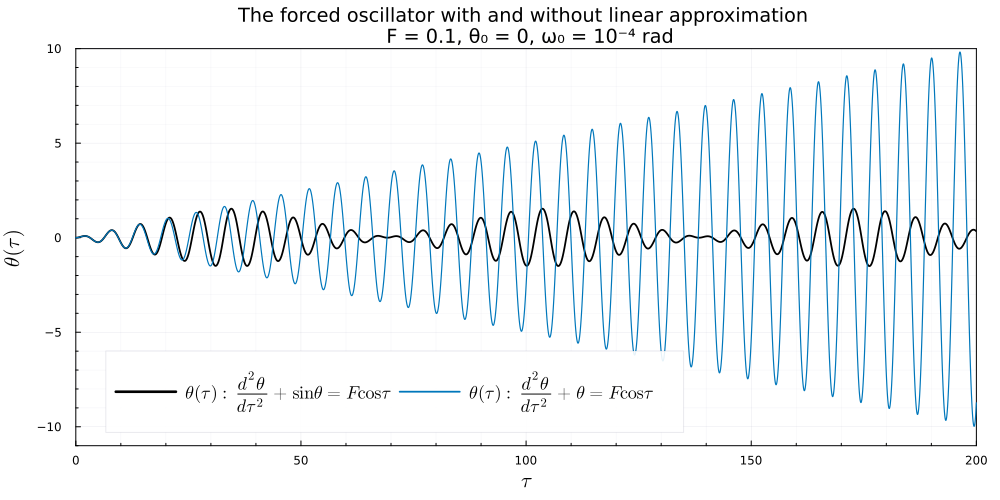

In [47]:
# Fig 1:

# Numerical solution
plot(sol, idxs = [2], tspan = (0, 200), ylim = (-11, 10), 
    lw = 1.8, c = "black", label = L"$\theta(\tau): \frac{d^{2}\theta}{d\tau^{2}} + \sin{\theta} = F\cos{\tau}$")

plot!(sol2, idxs = [2], tspan = (0, 200), lw = 1.2, label = L"$\theta(\tau): \frac{d^{2}\theta}{d\tau^{2}} + \theta = F\cos{\tau}$") 

# Specifications
plot!(title = "The forced oscillator with and without linear approximation \n F = 0.1, θ₀ = 0, ω₀ = 10⁻⁴ rad")
plot!(legendfontsize = 12, labelfontsize = 14, tickfontsize = 8, titlefontsize = 13, legendposition = :bottomleft, legend_column = 2,
      xlabel = L"\tau", ylabel = L"\theta(\tau)", margin=4mm, framestyle = :box, size = (1000, 500))

# Saving 
#savefig("PT1.pdf")

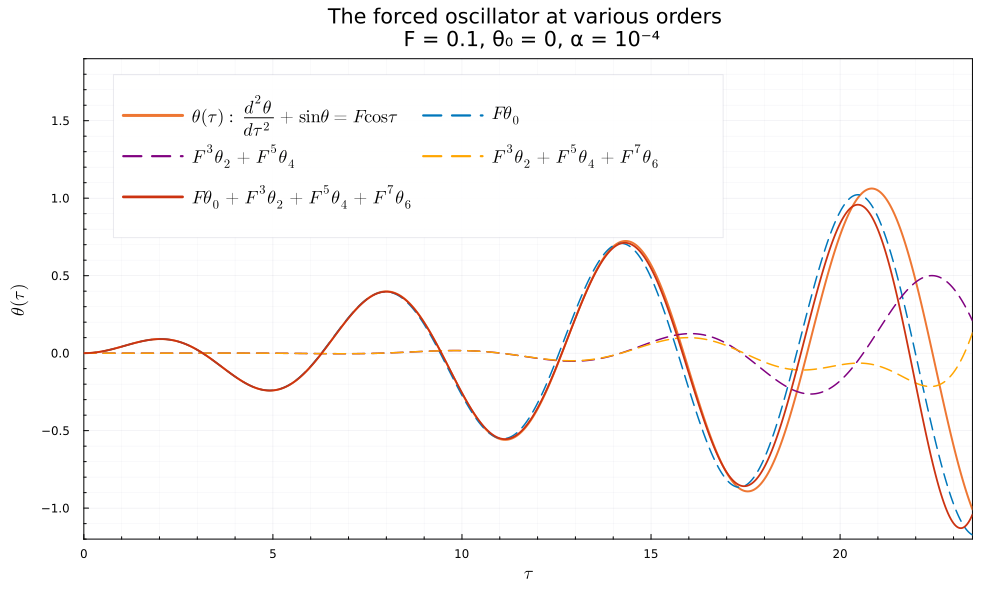

In [48]:
# Figs 4, 8:

# Numerical solution
plot(sol, idxs = [2], tspan = (0, 23.5), ylim = (-1.2, 1.9),
     lw = 2, label = L"$θ(τ): \frac{d^{2}θ}{dτ^{2}} + \sin{θ} = F\cos{τ}$", xlabel = L"τ", ylabel = L"θ(τ)") 

# O(F) solution
plot!(sol.t, t-> 0.1*(10^-4+0.5*t)*sin(t), lw = 1.5, ls = :dash, label = L"Fθ_{0}")

# O(F³) + O(F⁵) solution
plot!(sol.t, t-> -(0.1)^3*t^4*cos(t)/512 - (0.1)^5*t^7*sin(t)*(1/14)*(1/16384), label = L"F^{3}θ_{2} + F^{5}θ_{4}",
    ls = :dash, lw = 1.5, c = "purple")

# O(F³) + O(F⁵) + O(F⁷) solution
plot!(sol.t, t-> -(0.1)^3*t^4*cos(t)/512 - (0.1)^5*t^7*sin(t)*(1/14)*(1/16384) + (0.1)^7*t^10*cos(t)*(4.9046*10^-6)/20,
     label = L"F^{3}θ_{2} + F^{5}θ_{4} + F^{7}θ_{6}", lw = 1.5, ls = :dash, c = "orange")

# O(F⁷) solution
plot!(sol.t, t-> 0.1*(10^-4+0.5*t)*sin(t) - (0.1)^3*t^4*cos(t)/512 - (0.1)^5*t^7*sin(t)*(1/14)*(1/16384) + (0.1)^7*t^10*cos(t)*(4.9046*10^-6)/20,
    label = L"Fθ_{0} + F^{3}θ_{2} + F^{5}θ_{4} + F^{7}θ_{6}", lw = 1.8)

### All coefficients are calculated and included above ###

# Specifications
plot!(title = "The forced oscillator at various orders \n F = 0.1, θ₀ = 0, α = 10⁻⁴", margin=5mm, framestyle = :box, size = (1000, 600))
plot!(legendfontsize = 12, labelfontsize = 12, tickfontsize = 8, titlefontsize = 14, legendposition = :topleft, legend_column = 2)

#Saving 
#savefig("PT2.pdf")

# Figure 9 is derived from this bit as well - just comment out the lower orders and plot total numerical and total O(F⁷) solution for F = 0.01, 0.001

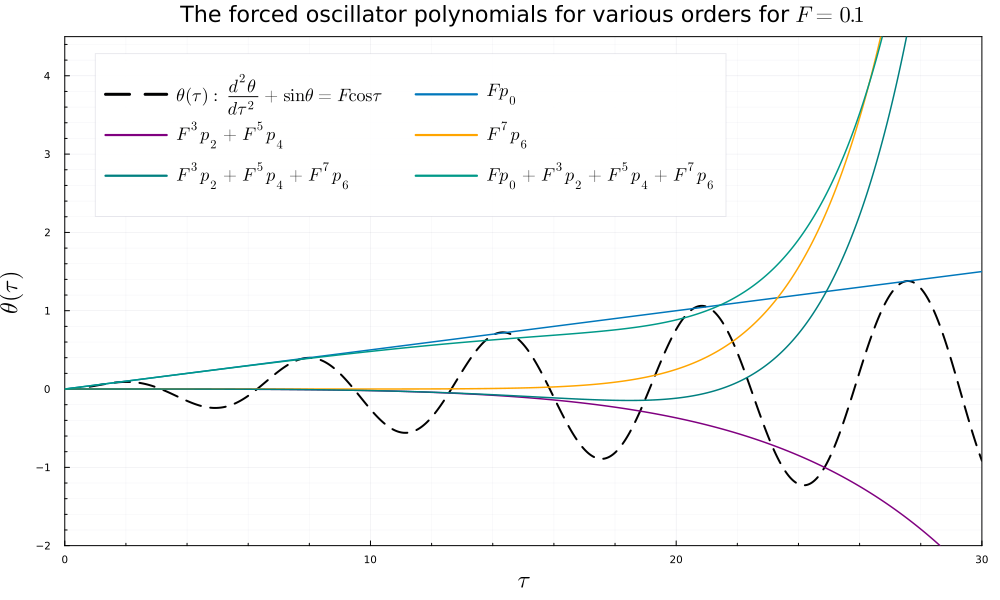

In [49]:
# Figure 5:

# Numerical solution
plot(sol, idxs = [2], tspan = (0, 30), ylim = (-2, 4.5), 
     c = "black", ls = :dash, lw = 2, label = L"$θ(τ): \frac{d^{2}θ}{dτ^{2}} + \sin{θ} = F\cos{τ}$", xlabel = L"\tau", ylabel = L"\theta(\tau)") 

# O(F) solution
plot!(sol.t, t-> 0.1*(10^-4+0.5*t), lw = 1.5, label = L"Fp_{0}")

# O(F³) + O(F⁵) solution
plot!(sol.t, t-> -(0.1)^3*t^4*(1/512) - (0.1)^5*t^7*(1/14)*(1/16384), label = L"F^{3}p_{2} + F^{5}p_{4}", lw = 1.5, c = "purple")

# O(F⁷) solution
plot!(sol.t, t-> (0.1)^7*t^10*(4.9046*10^-6)/20, lw = 1.5, label= L"F^{7}p_{6}",c = "orange")

# O(F³) + O(F⁵) + O(F⁷) solution
plot!(sol.t, t-> -(0.1)^3*t^4*(1/512) - (0.1)^5*t^7*(1/14)*(1/16384) + (0.1)^7*t^10*(4.9046*10^-6)/20,
      label = L"F^{3}p_{2} + F^{5}p_{4} + F^{7}p_{6}", lw = 1.5, c = "teal")

# Full solution
plot!(sol.t, t-> 0.1*(10^-4+0.5*t) -(0.1)^3*t^4*(1/512) - (0.1)^5*t^7*(1/14)*(1/16384) + (0.1)^7*t^10*(4.9046*10^-6)/20,
    label = L"Fp_{0} + F^{3}p_{2} + F^{5}p_{4} + F^{7}p_{6}", lw = 1.5)

#Specifications
plot!(legendfontsize = 12, labelfontsize = 16, tickfontsize = 7, size = (1000, 600), margin=2.6mm, framestyle = :box)
plot!(title = L"The forced oscillator polynomials for various orders for $F = 0.1$", titlefontsize = 15, legendposition = :topleft, legend_column = 2)

#Saving
#savefig("PT3.pdf")

#### Bounds

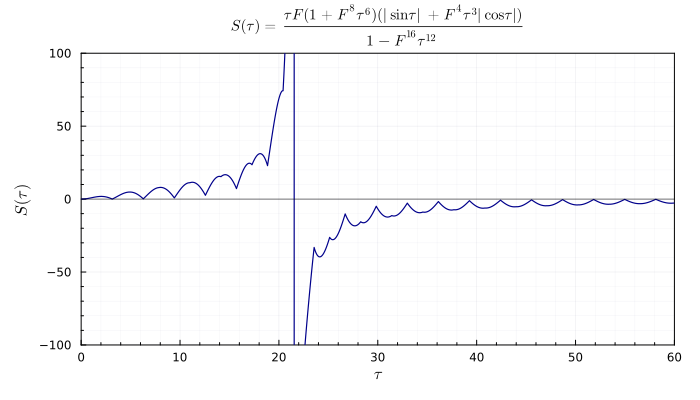

In [12]:
#For the fig in Bounds

# Specify the sum
δ = 0.1
z = range(0, 100, length = 100000)
f = @. (z*(1+δ^8*z^6)*(δ^4*z^3*abs(cos(z))+abs(sin(z))))/(1 - δ^16*z^12)

# Plot
plot(z,f, size = (700,400), ylim = (-100,100), xlim = (0,60), lw = 1.2, xlabel = L"$\tau$", ylabel = L"$S(\tau)$", framestyle = :box, legend = :false, c = "dark blue",
     margin = 4.5mm, title = L"$S(\tau) = \frac{\tau F (1+F^{8}\tau^{6})(|\sin\tau|+F^{4}\tau^{3}|\cos\tau|)}{1-F^{16}\tau^{12}}$", titlefontsize = 10)
hline!([0], lw = 0.5, c = "black")

# Saving
#savefig("PTbound.pdf")

### Scaling behaviour

In [13]:
theme(:vibrant)

#### Maximum amplitude

In [14]:
max = 327 # for F upto ~0.33
T = Array{Float64}(undef, max) # Define appropriate arrays to store data points
V = Array{Float64}(undef, max)
J = Array{Float64}(undef, max)

for i in 1:max
    J[i] = 0.001 + (i-1)*0.001 # Specification of the F distribution
end

for i in 1:max 
    PRP = ODEProblem(model, u_1, (0, 800), [ω => 1, F => J[i]], abstol = 1e-8, reltol = 1e-8) # Solve system for each F 
    SOL = solve(PRP, Rodas4P(), maxiters = 1e8)
    T[i], V[i] = get_max_t(PRP, 2) # Store the maximum amplitude 
end

fit = curve_fit(PowerFit, J, V) # Fit the data points to a power law

PowerFit{Float64}((3.597346408889326, 0.3636800004622443))

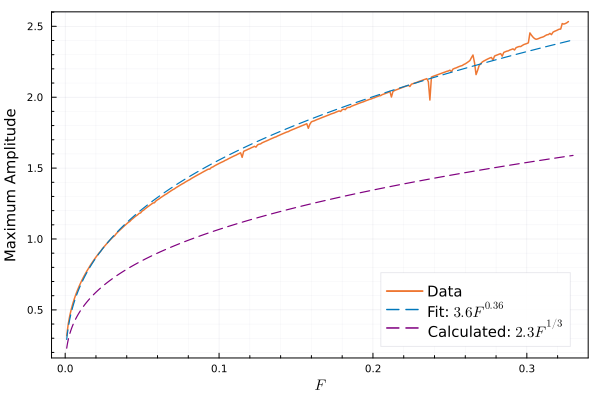

In [15]:
# Visualisation of the data points gathered

X = range(0.001, 0.33, length = 5000) # an appropriate x-axis range

Y_exp = @. X^(1/3)*2.3 # Expected behaviour
Y_0 = fit.(X) # Curve fitted to data points

# Plot
plot(J, V, xlabel = L"F", label = "Data", framestyle = :box,  ylabel = "Maximum Amplitude", lw = 1.5) # Plot data points
plot!(X, Y_0, label = L"Fit: $3.6F^{0.36}$", ls = :dash, lw = 1.2) # Plot fitted curve
plot!(X, Y_exp, label = L"Calculated: $2.3F^{1/3}$", ls = :dash, lw = 1.2, c = "purple") # Plot expected curve

# Specifications
plot!(legendposition = :bottomright, legendfontsize = 10, labelfontsize = 10, tickfontsize = 7) 

# Saving
#savefig("PTscaling1.pdf")

#### Time period

In [16]:
max2 = 300 # for F upto ~0.33
T2 = Array{Float64}(undef, max2)
T3 = Array{Float64}(undef, max2)
T4 = Array{Float64}(undef, max2)
V2 = Array{Float64}(undef, max2)
V3 = Array{Float64}(undef, max2)
V4 = Array{Float64}(undef, max2)
J2 = Array{Float64}(undef, max2)

for i in 1:max2
    J2[i] = 0.03 + (i-1)*0.001 # Specification of the F distribution - starts from 0.03 in this case because of issues 
                               # with get_max_t() which identifies exactly the highest ever amplitude instead of the first local maxima
end

for i in 1:max2 # Solve for each - broken up because of the issue above
    if i < 79
    PRP2 = ODEProblem(model, u_1, (0, 100), [ω => 1, F => J2[i]], abstol = 1e-8, reltol = 1e-8)
    SOL2 = solve(PRP2, Rodas4P(), maxiters = 1e8)
    T2[i], V2[i] = get_max_t(PRP2, 2)
    elseif (i >=79 && i<=182)
    PRP3 = ODEProblem(model, u_1, (0, 60), [ω => 1, F => J2[i]], abstol = 1e-8, reltol = 1e-8)
    SOL3 = solve(PRP3, Rodas4P(), maxiters = 1e8)
    T3[i], V3[i] = get_max_t(PRP3, 2)
    elseif i>182
    PRP4 = ODEProblem(model, u_1, (0, 40), [ω => 1, F => J2[i]], abstol = 1e-8, reltol = 1e-8)
    SOL4 = solve(PRP4, Rodas4P(), maxiters = 1e8)
    T4[i], V4[i] = get_max_t(PRP4, 2)
    end
end

# Convert to time period by multiplying the time point at which local maxima was achieved by 4
T₂ = Array{Float64}(undef, max2)
V₂ = Array{Float64}(undef, max2)
for i in 1:max2
    if i < 79
    T₂[i] = 4*T2[i]
    V₂[i] = V2[i]
    elseif (i >=79 && i<=182)
    T₂[i] = 4*T3[i]
    V₂[i] = V3[i]
    elseif i>182
    T₂[i] = 4*T4[i]
    V₂[i] = V4[i]
    end
end

fit = curve_fit(PowerFit, J2, T₂) # fit the data points to a power law

PowerFit{Float64}((26.397306143607533, -0.7159749284034465))

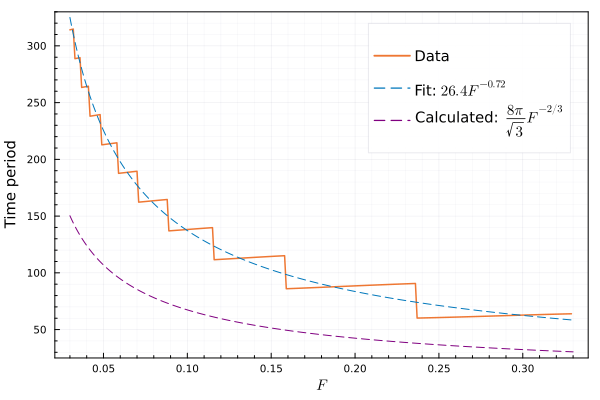

In [18]:
# Visualisation

L = range(0.03, 0.33, length = 5000) # appropriate x-axis range

Y_exp2 = @. L^(-2/3)*((8π)/√3) # Expected behaviour
Y_02 = fit.(L) # Fitted curve

plot(J2, T₂, xlabel = L"F", label = "Data", framestyle = :box,  ylabel = "Time period", lw = 1.5) # Plot data points
plot!(L, Y_02, label = L"Fit: $26.4F^{-0.72}$", ls = :dash, lw = 1) # Plot fitted curve
plot!(L, Y_exp2, label = L"Calculated: $\frac{8\pi}{\sqrt{3}}F^{-2/3}$", ls = :dash, lw = 1, c = "purple") # Plot expected curve

# Specifications
plot!(legendposition = :topright, legendfontsize = 10, labelfontsize = 10, tickfontsize = 7, ylim = (25, 330))

# Saving
#savefig("PTscaling2.pdf")